<a href="https://colab.research.google.com/github/theviderlab/computer_vision/blob/main/Faster_R_CNN_con_Detectron2_Entrenamiento.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Paso 1: Instalar Detectron2
!pip install -q torch torchvision torchaudio
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 80.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.5 MB/s eta 0:00:00
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-l0h5en4m
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/

In [ ]:
# Paso 2: Imports
import torch
import cv2
from google.colab.patches import cv2_imshow
from google.colab import drive

import numpy as np
import matplotlib.pyplot as plt
from detectron2.engine import DefaultPredictor
from detectron2.engine import DefaultTrainer

from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2 import model_zoo

import json
import os
from detectron2.structures import BoxMode

In [ ]:
def convert_paris_json_to_detectron2(paris_json_path, image_root_dir, category_id=0):
    """
    Convierte el formato del dataset de Paris al formato esperado por Detectron2.
    Elimina subdirectorios falsos en los campos 'url'.

    Args:
        paris_json_path (str): Ruta al JSON original de Paris.
        image_root_dir (str): Ruta al directorio raíz donde están las imágenes.
        category_id (int): ID de la clase a usar (por defecto 0 para una única clase).

    Returns:
        list: Lista de diccionarios compatibles con Detectron2.
    """
    with open(paris_json_path, 'r') as f:
        paris_data = json.load(f)

    detectron2_dataset = []
    for idx, item in enumerate(paris_data):
        # Extraer solo el nombre de archivo (sin subdirectorio)
        filename = os.path.basename(item["url"])
        img_path = os.path.join(image_root_dir, filename)

        record = {
            "file_name": img_path,
            "image_id": idx,
            "height": item["height"],
            "width": item["width"],
            "annotations": []
        }

        for box in item["bboxes"]:
            x = box["x0"]
            y = box["y0"]
            w = box["x1"] - box["x0"]
            h = box["y1"] - box["y0"]
            annotation = {
                "bbox": [x, y, w, h],
                "bbox_mode": BoxMode.XYWH_ABS,
                "category_id": category_id
            }
            record["annotations"].append(annotation)

        if record["annotations"]:
            detectron2_dataset.append(record)

    return detectron2_dataset

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
base_path = "/content/drive/MyDrive/ViderLab/06 - INFORMACIÓN/Capacitación/Master/TFM/Código/assets/database/datasets/rparis6k"
paris_json_path = base_path + "/face-annotations-v1.json"
paris_json_detectron2_path = base_path + "/face-annotations-v1-detectron2.json"
image_root_dir = base_path + "/jpg/"
output_dir = "/content/drive/MyDrive/ViderLab/06 - INFORMACIÓN/Capacitación/Master/TFM/Código/assets/weights/faster_r-cnn_finetuned_paris6k"

In [ ]:
converted = convert_paris_json_to_detectron2(paris_json_path, image_root_dir)

with open(paris_json_detectron2_path, "w") as f:
    json.dump(converted, f, indent=2)

In [ ]:
# 2. Cargar el JSON convertido
with open(paris_json_detectron2_path, "r") as f:
    paris_dataset = json.load(f)

In [ ]:
paris_dataset

[{'file_name': '/content/drive/MyDrive/ViderLab/06 - INFORMACIÓN/Capacitación/Master/TFM/Código/assets/database/datasets/rparis6k/jpg/paris_defense_000005.jpg',
  'image_id': 3,
  'height': 1024,
  'width': 1024,
  'annotations': [{'bbox': [492, 872, 40, 44],
    'bbox_mode': 1,
    'category_id': 0}]},
 {'file_name': '/content/drive/MyDrive/ViderLab/06 - INFORMACIÓN/Capacitación/Master/TFM/Código/assets/database/datasets/rparis6k/jpg/paris_defense_000006.jpg',
  'image_id': 4,
  'height': 684,
  'width': 1024,
  'annotations': [{'bbox': [391, 504, 13, 15],
    'bbox_mode': 1,
    'category_id': 0},
   {'bbox': [375, 507, 13, 14], 'bbox_mode': 1, 'category_id': 0},
   {'bbox': [766, 491, 11, 12], 'bbox_mode': 1, 'category_id': 0}]},
 {'file_name': '/content/drive/MyDrive/ViderLab/06 - INFORMACIÓN/Capacitación/Master/TFM/Código/assets/database/datasets/rparis6k/jpg/paris_defense_000034.jpg',
  'image_id': 21,
  'height': 768,
  'width': 1024,
  'annotations': [{'bbox': [492, 433, 52, 72

In [ ]:
# 3. Registrar el dataset
DatasetCatalog.register("paris_train_v3", lambda: paris_dataset)
MetadataCatalog.get("paris_train_v3").set(thing_classes=["landmark"])

namespace(name='paris_train_v3', thing_classes=['landmark'])

In [ ]:
# 4. Configuración
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("paris_train_v3",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2

# 👇 Peso solo de ImageNet (no COCO)
cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-50.pkl"

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0003
cfg.SOLVER.MAX_ITER = 15000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # solo una clase: 'landmark'

cfg.OUTPUT_DIR = output_dir
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [ ]:
# 5. Entrenamiento
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)

[05/03 10:53:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_head.fc1.{bias, weight}
roi_heads.box_head.fc2.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
  fc1000.{bias, weight}
  stem.conv1.bias


In [ ]:
trainer.train()

[05/03 10:53:21 d2.engine.train_loop]: Starting training from iteration 0
[05/03 10:53:30 d2.utils.events]:  eta: 1:47:47  iter: 19  total_loss: 1.434  loss_cls: 0.5094  loss_box_reg: 0.01794  loss_rpn_cls: 0.6756  loss_rpn_loc: 0.2478    time: 0.4278  last_time: 0.3371  data_time: 0.0204  last_data_time: 0.0052   lr: 5.9943e-06  max_mem: 2800M
[05/03 10:53:39 d2.utils.events]:  eta: 1:46:01  iter: 39  total_loss: 1.322  loss_cls: 0.3295  loss_box_reg: 0.02268  loss_rpn_cls: 0.6722  loss_rpn_loc: 0.2227    time: 0.4202  last_time: 0.3999  data_time: 0.0090  last_data_time: 0.0051   lr: 1.1988e-05  max_mem: 2800M
[05/03 10:53:48 d2.utils.events]:  eta: 1:46:24  iter: 59  total_loss: 1.067  loss_cls: 0.2011  loss_box_reg: 0.02612  loss_rpn_cls: 0.6635  loss_rpn_loc: 0.0963    time: 0.4300  last_time: 0.5139  data_time: 0.0100  last_data_time: 0.0053   lr: 1.7982e-05  max_mem: 2800M
[05/03 10:53:56 d2.utils.events]:  eta: 1:45:52  iter: 79  total_loss: 1.063  loss_cls: 0.1583  loss_box_re

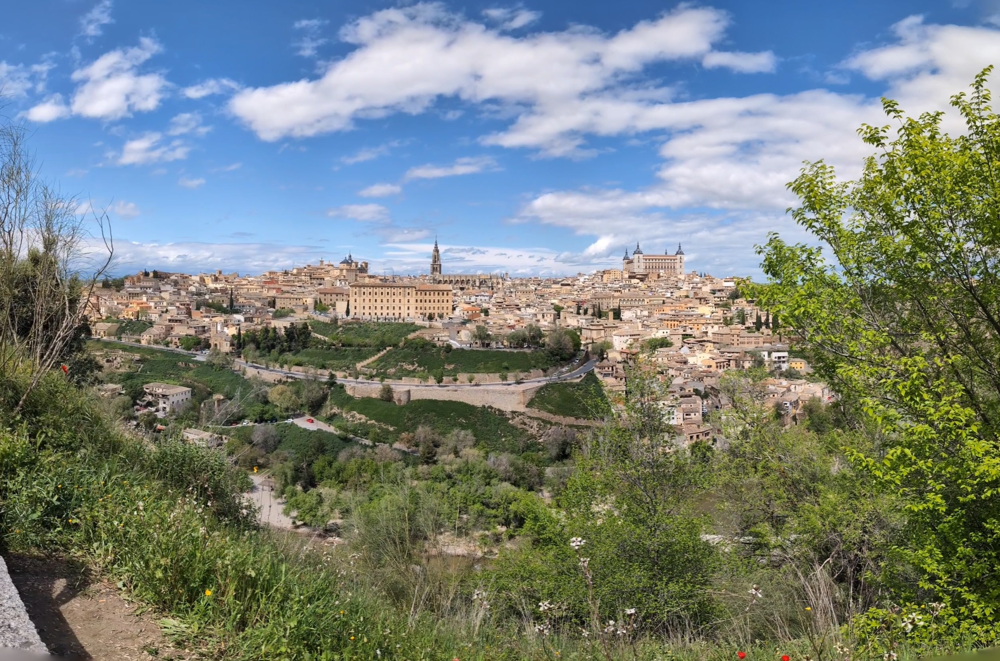

In [ ]:
# Paso 4: Cargar imagen de prueba
from google.colab.patches import cv2_imshow
image_url = "https://playground.viderlab.com/wp-content/uploads/2025/05/PXL_20250418_131913933.PANO-min.jpg"
!wget -q {image_url} -O test.jpg
image = cv2.imread("test.jpg")
cv2_imshow(image)

/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


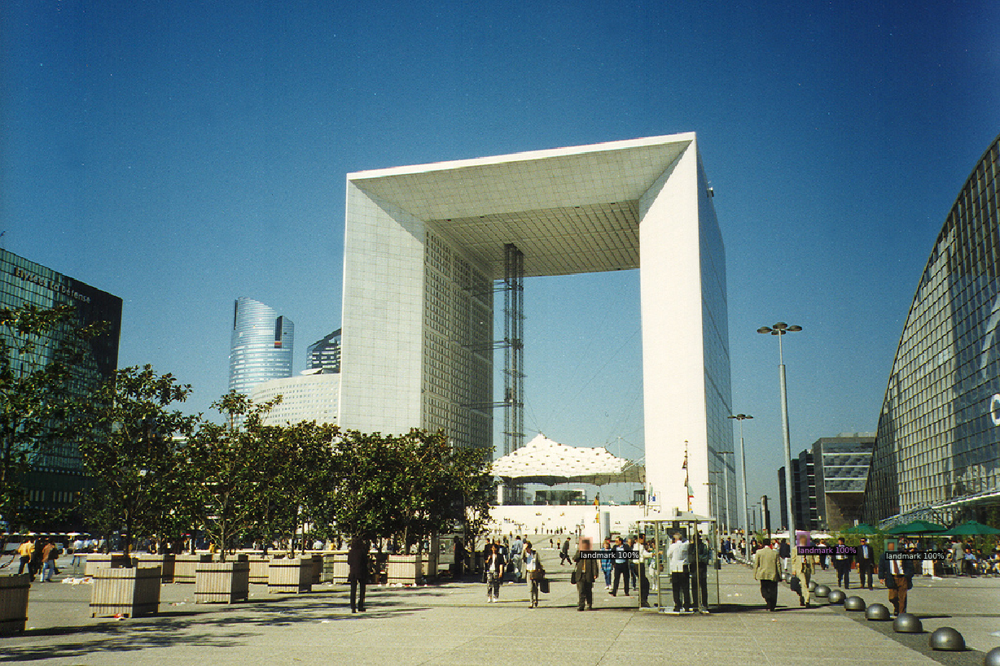

In [ ]:
# 1. Cargar configuración y pesos entrenados
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # umbral de confianza para predicción
cfg.DATASETS.TEST = ("paris_train_v3",)  # necesario para recuperar la metadata
predictor = DefaultPredictor(cfg)

# 2. Cargar una imagen de prueba
test_image_path = image_root_dir+"/paris_defense_000176.jpg"
image = cv2.imread(test_image_path)

# 3. Hacer predicción
outputs = predictor(image)

# 4. Visualizar resultados
v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TEST[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])